# DATA IMPORTING

In [2]:
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.feature_extraction.text import CountVectorizer 
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
#from sklearn.utils import s1804
from sklearn.metrics import roc_auc_score

In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/minifile/Data_file.csv


In [4]:
df=pd.read_csv('/kaggle/input/minifile/Data_file.csv')

Variable	Definition
label	Flag indicating whether the user paid back the credit amount within 5 days of issuing the loan{1:success, 0:failure}
msisdn	mobile number of user
aon	age on cellular network in days
daily_decr30	Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)
daily_decr90	Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)
rental30	Average main account balance over last 30 days
rental90	Average main account balance over last 90 days
last_rech_date_ma	Number of days till last recharge of main account
last_rech_date_da	Number of days till last recharge of data account
last_rech_amt_ma	Amount of last recharge of main account (in Indonesian Rupiah)
cnt_ma_rech30	Number of times main account got recharged in last 30 days
fr_ma_rech30	Frequency of main account recharged in last 30 days
sumamnt_ma_rech30	Total amount of recharge in main account over last 30 days (in Indonesian Rupiah)
medianamnt_ma_rech30	Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah)
medianmarechprebal30	Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)
cnt_ma_rech90	Number of times main account got recharged in last 90 days
fr_ma_rech90	Frequency of main account recharged in last 90 days
sumamnt_ma_rech90	Total amount of recharge in main account over last 90 days (in Indian Rupee)
medianamnt_ma_rech90	Median of amount of recharges done in main account over last 90 days at user level (in Indian Rupee)
medianmarechprebal90	Median of main account balance just before recharge in last 90 days at user level (in Indian Rupee)
cnt_da_rech30	Number of times data account got recharged in last 30 days
fr_da_rech30	Frequency of data account recharged in last 30 days
cnt_da_rech90	Number of times data account got recharged in last 90 days
fr_da_rech90	Frequency of data account recharged in last 90 days
cnt_loans30	Number of loans taken by user in last 30 days
amnt_loans30	Total amount of loans taken by user in last 30 days
maxamnt_loans30	maximum amount of loan taken by the user in last 30 days
medianamnt_loans30	Median of amounts of loan taken by the user in last 30 days
cnt_loans90	Number of loans taken by user in last 90 days
amnt_loans90	Total amount of loans taken by user in last 90 days
maxamnt_loans90	maximum amount of loan taken by the user in last 90 days
medianamnt_loans90	Median of amounts of loan taken by the user in last 90 days
payback30	Average payback time in days over last 30 days
payback90	Average payback time in days over last 90 days
pcircle	telecom circle
pdate	date
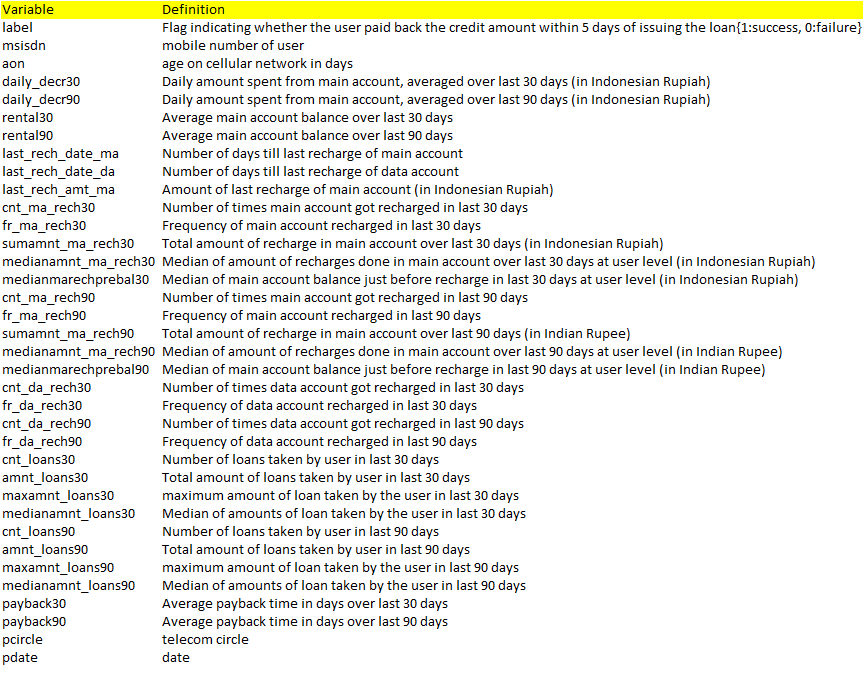

In [5]:
df

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,...,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,...,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,...,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,...,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,...,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,209589,1,22758I85348,404.0,151.872333,151.872333,1089.19,1089.19,1.0,0.0,...,6.0,0.0,2.0,12,6,0.0,1.000000,1.000000,UPW,2016-06-17
209589,209590,1,95583I84455,1075.0,36.936000,36.936000,1728.36,1728.36,4.0,0.0,...,6.0,0.0,3.0,18,6,0.0,1.000000,1.000000,UPW,2016-06-12
209590,209591,1,28556I85350,1013.0,11843.111667,11904.350000,5861.83,8893.20,3.0,0.0,...,12.0,0.0,6.0,54,12,0.0,4.000000,3.833333,UPW,2016-07-29
209591,209592,1,59712I82733,1732.0,12488.228333,12574.370000,411.83,984.58,2.0,38.0,...,12.0,0.0,3.0,24,12,0.0,0.000000,10.500000,UPW,2016-07-25


In [6]:
df.columns

Index(['Unnamed: 0', 'label', 'msisdn', 'aon', 'daily_decr30', 'daily_decr90',
       'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_date_da',
       'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30',
       'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30',
       'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90',
       'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30',
       'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30',
       'amnt_loans30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'medianamnt_loans90', 'payback30',
       'payback90', 'pcircle', 'pdate'],
      dtype='object')

# DATA VISUALIZATION

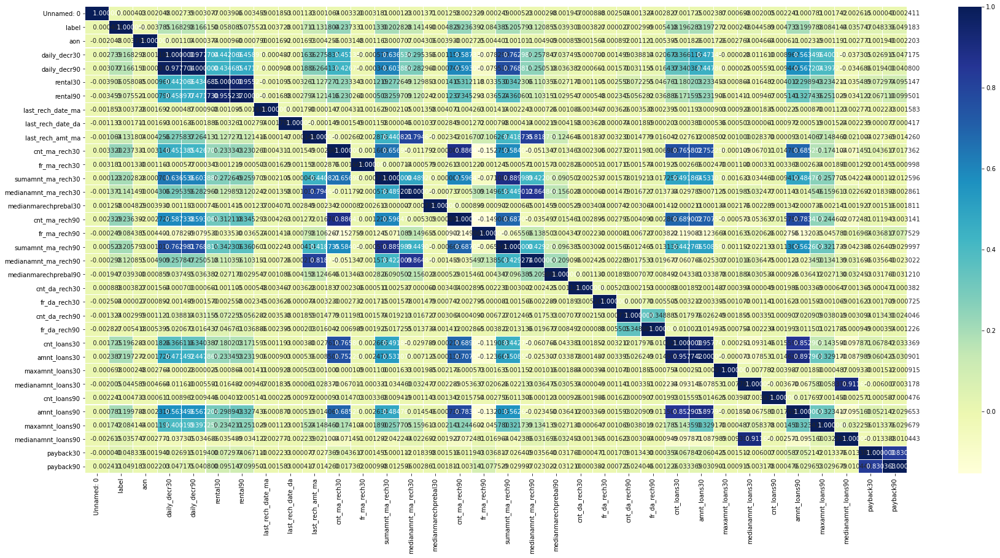

In [8]:
plt.figure(figsize=(30,14))
sns.heatmap(df.corr(),linewidths=.1,fmt="19f",cmap="YlGnBu", annot=True)
plt.yticks(rotation=0);

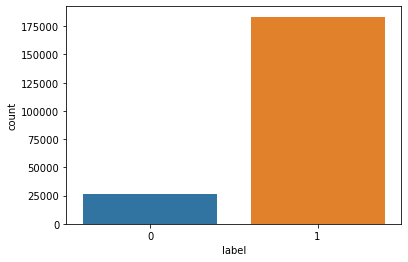

In [9]:
sns.countplot(df['label'])


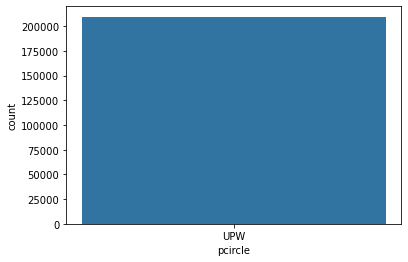

In [10]:
sns.countplot(df['pcircle'])

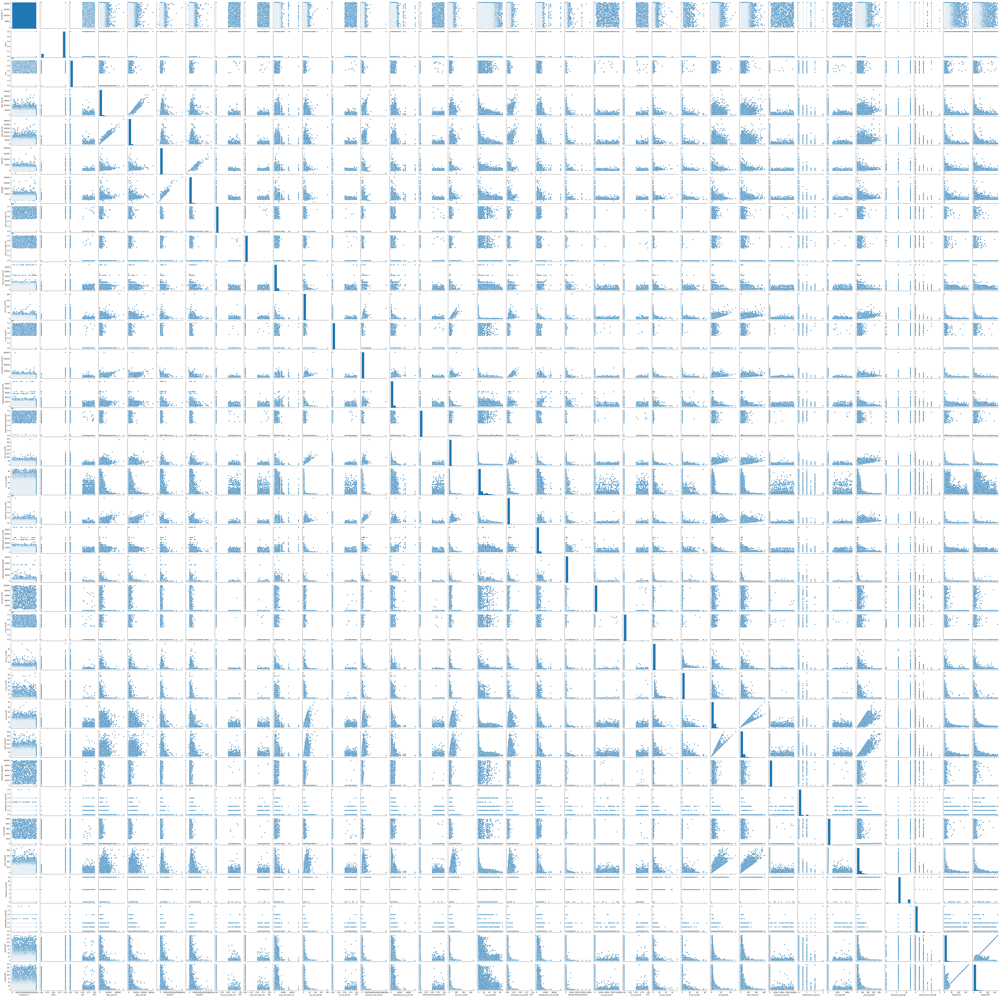

In [11]:
sns.pairplot(df)

In [12]:
def plot_stats(feature,label_rotation=False,horizontal_layout=True):
    temp = df[feature].value_counts()
    df1 = pd.DataFrame({feature: temp.index,'Number of contracts': temp.values})

    # Calculate the percentage of target=1 per category value
    cat_perc = df[[feature, 'label']].groupby([feature],as_index=False).mean()
    cat_perc.sort_values(by='label', ascending=False, inplace=True)
    
    if(horizontal_layout):
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12,6))
    else:
        fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12,14))
    sns.set_color_codes("pastel")
    s = sns.barplot(ax=ax1, x = feature, y="Number of contracts",data=df1)
    if(label_rotation):
        s.set_xticklabels(s.get_xticklabels(),rotation=90)
    
    s = sns.barplot(ax=ax2, x = feature, y='label', order=cat_perc[feature], data=cat_perc)
    if(label_rotation):
        s.set_xticklabels(s.get_xticklabels(),rotation=90)
    plt.ylabel('Percent of target with value 1 [%]', fontsize=10)
    plt.tick_params(axis='both', which='major', labelsize=10)

    plt.show();

In [13]:
def plot_distribution(var):
    
    i = 0
    t1 = df.loc[df['label'] != 0]
    t0 = df.loc[df['label'] == 0]

    sns.set_style('whitegrid')
    plt.figure()
    fig, ax = plt.subplots(2,2,figsize=(12,12))

    for feature in var:
        i += 1
        plt.subplot(2,2,i)
        sns.kdeplot(t1[feature], bw=0.5,label="label = 1")
        sns.kdeplot(t0[feature], bw=0.5,label="label = 0")
        plt.ylabel('Density plot', fontsize=12)
        plt.xlabel(feature, fontsize=12)
        locs, labels = plt.xticks()
        plt.tick_params(axis='both', which='major', labelsize=12)
    plt.show();

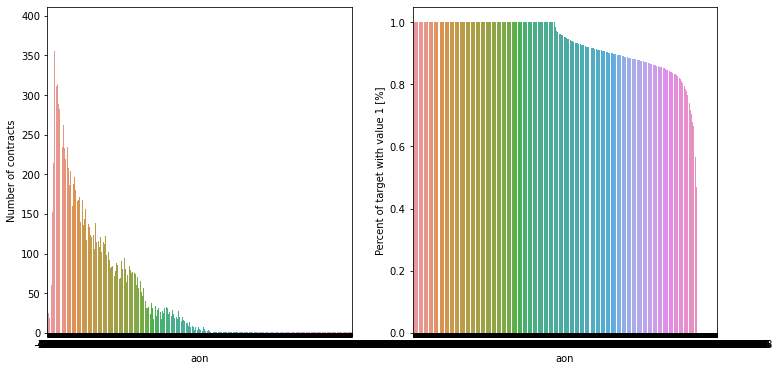

In [14]:
plot_stats('aon')

In [ ]:
plot_stats('daily_decr30')

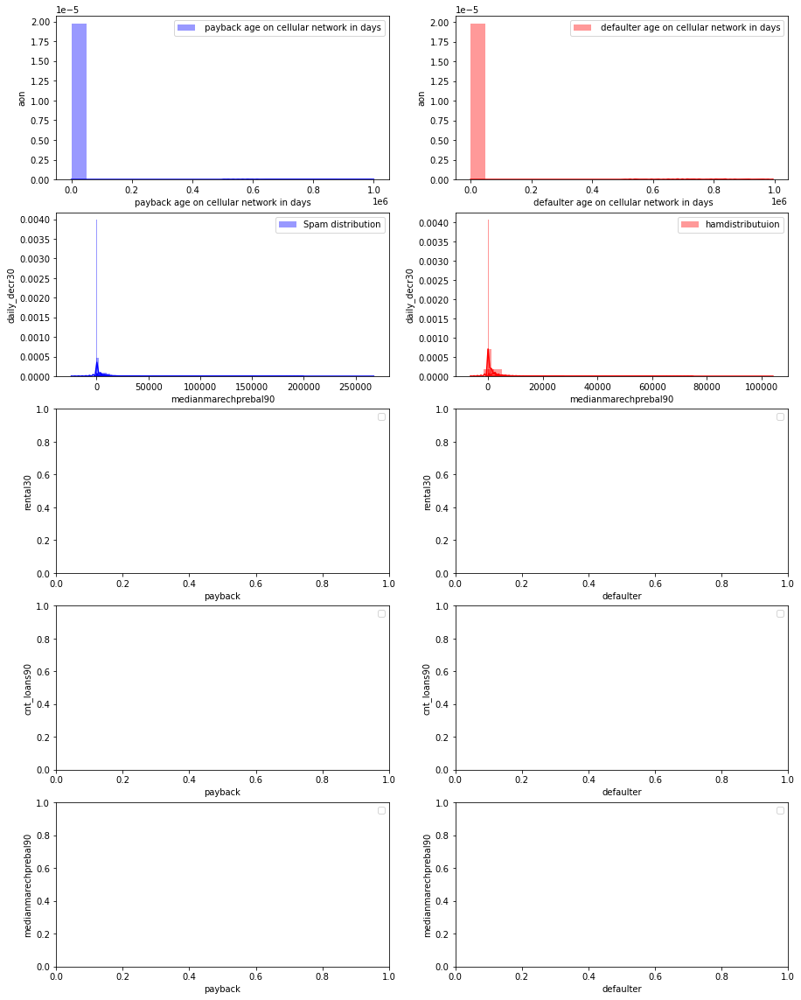

In [7]:
f,ax = plt.subplots(5,2 , figsize =(15,20))
sns.distplot(df[df['label']==1]['aon'],bins=20,ax=ax[0,0],label=' payback age on cellular network in days',color='b')

sns.distplot(df[df['label']==0]['aon'],bins=20,ax=ax[0,1],label=' defaulter age on cellular network in days',color='r')
ax[0,0].set_xlabel('payback age on cellular network in days')
ax[0,1].set_xlabel(' defaulter age on cellular network in days')
ax[0,0].set_ylabel('aon')
ax[0,1].set_ylabel('aon')
ax[0,0].legend()
ax[0,1].legend()


sns.distplot(df[df['label']==1]['daily_decr30'],bins=20,ax=ax[1,0],label='Spam distribution',color='b')

sns.distplot(df[df['label']==0]['daily_decr30'],bins=20,ax=ax[1,1],label='hamdistributuion',color='r')
ax[1,0].set_xlabel('payback')
ax[1,1].set_xlabel('defaulter')
ax[1,0].set_ylabel('daily_decr30')
ax[1,1].set_ylabel('daily_decr30')
ax[1,0].legend()
ax[1,1].legend()

sns.distplot(df[df['label']==1]['rental30'],bins=20,ax=ax[1,0],label='Spam distribution',color='b')

sns.distplot(df[df['label']==0]['rental30'],bins=20,ax=ax[1,1],label='hamdistributuion',color='r')
ax[2,0].set_xlabel('payback')
ax[2,1].set_xlabel('defaulter')
ax[2,0].set_ylabel('rental30')
ax[2,1].set_ylabel('rental30')
ax[2,0].legend()
ax[2,1].legend()




sns.distplot(df[df['label']==1]['cnt_loans90'],bins=20,ax=ax[1,0],label='paybackn',color='b')

sns.distplot(df[df['label']==0]['cnt_loans90'],bins=20,ax=ax[1,1],label='defaulter',color='r')
ax[3,0].set_xlabel('payback')
ax[3,1].set_xlabel('defaulter')
ax[3,0].set_ylabel('cnt_loans90')
ax[3,1].set_ylabel('cnt_loans90')
ax[3,0].legend()
ax[3,1].legend()





sns.distplot(df[df['label']==1]['medianmarechprebal90'],bins=20,ax=ax[1,0],label='paybackn distribution',color='b')

sns.distplot(df[df['label']==0]['medianmarechprebal90'],bins=20,ax=ax[1,1],label='defaulter',color='r')
ax[4,0].set_xlabel('payback')
ax[4,1].set_xlabel('defaulter')
ax[4,0].set_ylabel('medianmarechprebal90')
ax[4,1].set_ylabel('medianmarechprebal90')
ax[4,0].legend()
ax[4,1].legend()




Skewness: 3.946230
Kurtosis: 30.971987


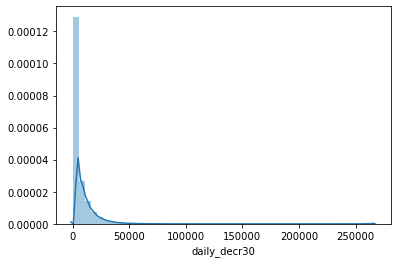

In [8]:
sns.distplot(df['daily_decr30']);
#skewness and kurtosis
print("Skewness: %f" % df['daily_decr30'].skew())
print("Kurtosis: %f" % df['daily_decr30'].kurt())

Skewness: 10.392949
Kurtosis: 109.258003


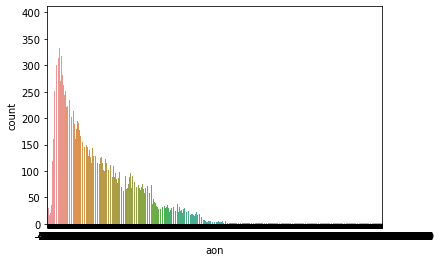

In [9]:
sns.countplot(df['aon']);
#skewness and kurtosis
print("Skewness: %f" % df['aon'].skew())
print("Kurtosis: %f" % df['aon'].kurt())

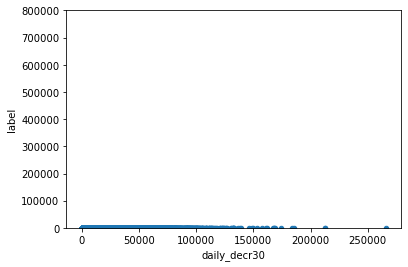

In [10]:
var = 'daily_decr30'
data = pd.concat([df['label'], df[var]], axis=1)
data.plot.scatter(x=var, y='label', ylim=(0,800000));

In [11]:
df.pcircle.astype(str)

0         UPW
1         UPW
2         UPW
3         UPW
4         UPW
         ... 
209588    UPW
209589    UPW
209590    UPW
209591    UPW
209592    UPW
Name: pcircle, Length: 209593, dtype: object

In [12]:
df.dtypes

Unnamed: 0                int64
label                     int64
msisdn                   object
aon                     float64
daily_decr30            float64
daily_decr90            float64
rental30                float64
rental90                float64
last_rech_date_ma       float64
last_rech_date_da       float64
last_rech_amt_ma          int64
cnt_ma_rech30             int64
fr_ma_rech30            float64
sumamnt_ma_rech30       float64
medianamnt_ma_rech30    float64
medianmarechprebal30    float64
cnt_ma_rech90             int64
fr_ma_rech90              int64
sumamnt_ma_rech90         int64
medianamnt_ma_rech90    float64
medianmarechprebal90    float64
cnt_da_rech30           float64
fr_da_rech30            float64
cnt_da_rech90             int64
fr_da_rech90              int64
cnt_loans30               int64
amnt_loans30              int64
maxamnt_loans30         float64
medianamnt_loans30      float64
cnt_loans90             float64
amnt_loans90              int64
maxamnt_

# > ****#model visualization

In [13]:
naive = MultinomialNB()
rf = RandomForestClassifier(n_estimators = 100, random_state = 42)
svm = SVC(random_state = 1)
dtc = DecisionTreeClassifier()
knn = KNeighborsClassifier(n_neighbors = 2)
model = LogisticRegression()
Z1=[rf,svm,model]
z=[rf,model]

In [14]:
y= df['label']
X = df.drop(['Unnamed: 0','label','msisdn','pcircle','pdate'],axis=1)


In [15]:

X_train,x_test,Y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [16]:
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.feature_extraction.text import CountVectorizer 
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, accuracy_score
#from sklearn.utils import s1804
from collections import Counter

Final score RandomForestClassifier(random_state=42) = > 0.9120685130847587
              precision    recall  f1-score   support

           0       0.76      0.44      0.56      5297
           1       0.92      0.98      0.95     36622

    accuracy                           0.91     41919
   macro avg       0.84      0.71      0.75     41919
weighted avg       0.90      0.91      0.90     41919



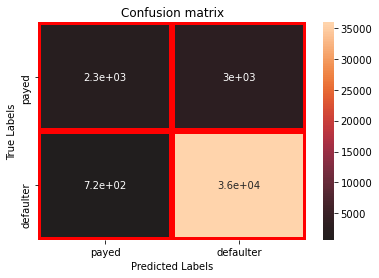

Final score SVC(random_state=1) = > 0.873637252797061
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      5297
           1       0.87      1.00      0.93     36622

    accuracy                           0.87     41919
   macro avg       0.44      0.50      0.47     41919
weighted avg       0.76      0.87      0.81     41919



/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


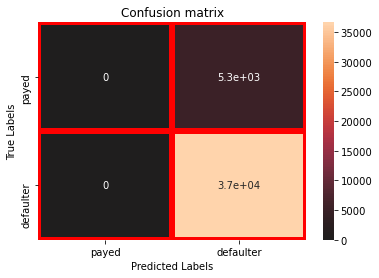

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


Final score LogisticRegression() = > 0.8686514468379494
              precision    recall  f1-score   support

           0       0.45      0.19      0.27      5297
           1       0.89      0.97      0.93     36622

    accuracy                           0.87     41919
   macro avg       0.67      0.58      0.60     41919
weighted avg       0.84      0.87      0.84     41919



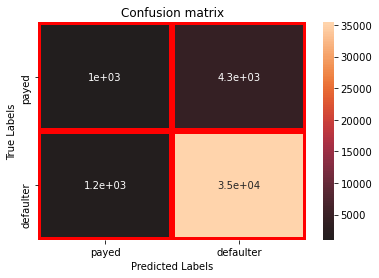

In [17]:

for i in Z1:
    i.fit(X_train,Y_train)
    y_pred = i.predict(x_test)
    print ('Final score {} = >' .format( i ) , accuracy_score(y_test,y_pred))
    print(classification_report(y_test, y_pred))

    conf_mat = confusion_matrix(y_test,y_pred)

    ax=plt.subplot()

    sns.heatmap(conf_mat,annot=True,ax=ax,linewidths=5,linecolor='r',center=0)

    ax.set_xlabel('Predicted Labels');ax.set_ylabel('True Labels')

    ax.set_title('Confusion matrix')
    ax.xaxis.set_ticklabels(['payed','defaulter'])
    ax.yaxis.set_ticklabels(['payed','defaulter'])
    plt.show()



# #MODEL SELECTION

# RAC  AUC Curve

In [18]:
y= df['label']
X = df.drop(['Unnamed: 0', 'label', 'msisdn', 'last_rech_date_da',
       'medianmarechprebal90', 'cnt_da_rech30',
       'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90',
        'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90',
         'medianamnt_loans90', 'payback30',
       'payback90', 'pcircle', 'pdate'],axis=1)

X_train,x_test,Y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

Final score RandomForestClassifier(random_state=42) = > 0.9108995920704215
              precision    recall  f1-score   support

           0       0.75      0.44      0.56      5297
           1       0.92      0.98      0.95     36622

    accuracy                           0.91     41919
   macro avg       0.84      0.71      0.75     41919
weighted avg       0.90      0.91      0.90     41919



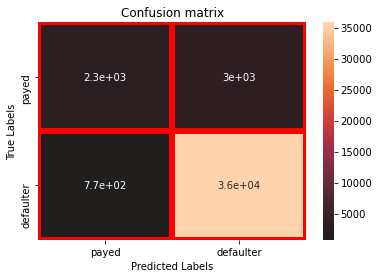

roc_auc value: 0.7094503122053697


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # This is added back by InteractiveShellApp.init_path()


Final score LogisticRegression() = > 0.8673871036999928
              precision    recall  f1-score   support

           0       0.44      0.20      0.28      5297
           1       0.89      0.96      0.93     36622

    accuracy                           0.87     41919
   macro avg       0.67      0.58      0.60     41919
weighted avg       0.84      0.87      0.84     41919



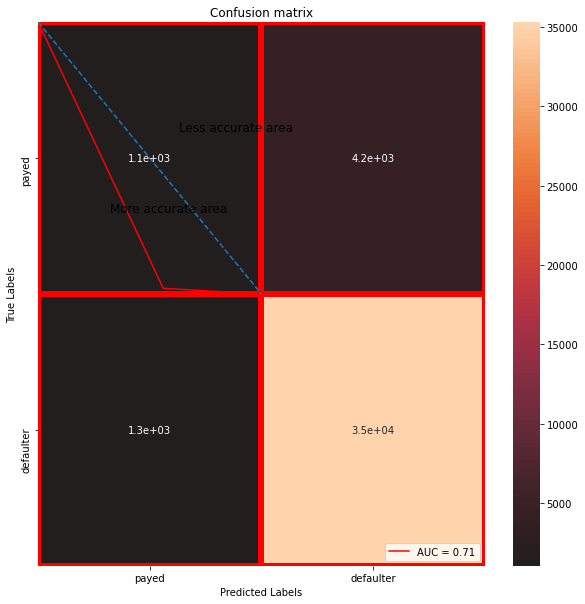

roc_auc value: 0.5816036755379366


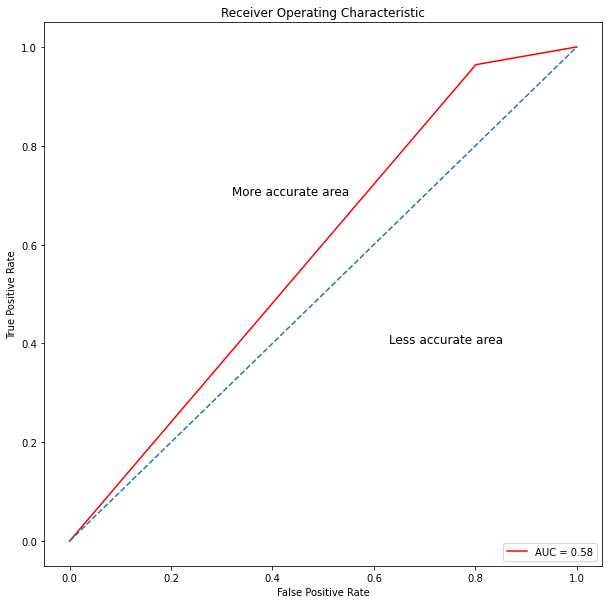

In [19]:

from sklearn.metrics import roc_curve, auc
from sklearn import metrics
for i in z:
    i.fit(X_train,Y_train)
    y_pred = i.predict(x_test)
    print ('Final score {} = >' .format( i ) , accuracy_score(y_test,y_pred))
    print(classification_report(y_test, y_pred))

    conf_mat = confusion_matrix(y_test,y_pred)

    ax=plt.subplot()

    sns.heatmap(conf_mat,annot=True,ax=ax,linewidths=5,linecolor='r',center=0)

    ax.set_xlabel('Predicted Labels');ax.set_ylabel('True Labels')

    ax.set_title('Confusion matrix')
    ax.xaxis.set_ticklabels(['payed','defaulter'])
    ax.yaxis.set_ticklabels(['payed','defaulter'])
    plt.show()
   

    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    print("roc_auc value: {}" .format(roc_auc))


    plt.figure(figsize=(10,10))
    plt.title('Receiver Operating Characteristic')
    plt.plot(false_positive_rate,true_positive_rate, color='red',label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],linestyle='--')
    plt.axis('tight')
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.text(0.32,0.7,'More accurate area',fontsize = 12)
    plt.text(0.63,0.4,'Less accurate area',fontsize = 12)


In [20]:
df.tail(5)

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
209588,209589,1,22758I85348,404.0,151.872333,151.872333,1089.19,1089.19,1.0,0.0,...,6.0,0.0,2.0,12,6,0.0,1.0,1.000000,UPW,2016-06-17
209589,209590,1,95583I84455,1075.0,36.936000,36.936000,1728.36,1728.36,4.0,0.0,...,6.0,0.0,3.0,18,6,0.0,1.0,1.000000,UPW,2016-06-12
209590,209591,1,28556I85350,1013.0,11843.111667,11904.350000,5861.83,8893.20,3.0,0.0,...,12.0,0.0,6.0,54,12,0.0,4.0,3.833333,UPW,2016-07-29
209591,209592,1,59712I82733,1732.0,12488.228333,12574.370000,411.83,984.58,2.0,38.0,...,12.0,0.0,3.0,24,12,0.0,0.0,10.500000,UPW,2016-07-25
209592,209593,1,65061I85339,1581.0,4489.362000,4534.820000,483.92,631.20,13.0,0.0,...,12.0,0.0,2.0,18,12,0.0,0.0,0.000000,UPW,2016-07-07


In [21]:
df = df.sample(frac = 1)
df.tail(5)

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
74353,74354,1,65323I70786,622809.531633,5663.957333,5702.420000,8491.19,10298.45,1.0,0.0,...,6.0,0.0,1.0,6,6,0.0,0.0,0.00,UPW,2016-07-14
42382,42383,0,66406I70378,458.000000,12.533333,12.533333,0.00,0.00,0.0,0.0,...,6.0,0.0,1.0,6,6,0.0,0.0,0.00,UPW,2016-06-08
167147,167148,1,65351I84451,717.000000,136.728000,136.728000,432.00,432.00,2.0,0.0,...,6.0,0.0,4.0,24,6,0.0,2.0,2.00,UPW,2016-06-24
11517,11518,1,47908I95201,419.000000,1341.686333,1346.710000,1556.72,1610.40,3.0,0.0,...,6.0,0.0,8.0,48,6,0.0,2.5,2.25,UPW,2016-07-01
183249,183250,1,90288I70379,648.000000,4268.775333,4290.780000,319.13,410.13,3.0,0.0,...,6.0,0.0,3.0,18,6,0.0,6.0,6.00,UPW,2016-07-13


In [22]:
def objective(hyperparameters, iteration):
    """Objective function for grid and random search. Returns
       the cross validation score from a set of hyperparameters."""
    
    # Number of estimators will be found using early stopping
    if 'n_estimators' in hyperparameters.keys():
        del hyperparameters['n_estimators']
    
     # Perform n_folds cross validation
    cv_results = lgb.cv(hyperparameters, train_set, num_boost_round = 10000, nfold = N_FOLDS, 
                        early_stopping_rounds = 100, metrics = 'auc', seed = 42)
    
    # results to retun
    score = cv_results['auc-mean'][-1]
    estimators = len(cv_results['auc-mean'])
    hyperparameters['n_estimators'] = estimators 
    
    return [score, hyperparameters, iteration]

In [24]:
import lightgbm as lgb

# Splitting data
from sklearn.model_selection import train_test_split

N_FOLDS = 5
MAX_EVALS = 5

In [25]:
# Create a training and testing dataset
train_set = lgb.Dataset(data = X_train, label = Y_train)
test_set = lgb.Dataset(data = x_test, label = y_test)

# HYPER TUNING

In [26]:
import lightgbm as lgb
# Get default hyperparameters
model = lgb.LGBMClassifier()
default_params = model.get_params()

# Remove the number of estimators because we set this to 10000 in the cv call
del default_params['n_estimators']

# Cross validation with early stopping
cv_results = lgb.cv(default_params, train_set, num_boost_round = 10000, early_stopping_rounds = 100, 
                    metrics = 'auc', nfold = N_FOLDS, seed = 42)

/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:842: UserWarning: silent keyword has been found in `params` and will be ignored.
Please use silent argument of the Dataset constructor to pass this parameter.
  .format(key))


In [27]:
print('The maximum validation ROC AUC was: {:.5f} with a standard deviation of {:.5f}.'.format(cv_results['auc-mean'][-1], cv_results['auc-stdv'][-1]))
print('The optimal number of boosting rounds (estimators) was {}.'.format(len(cv_results['auc-mean'])))

The maximum validation ROC AUC was: 0.90051 with a standard deviation of 0.00181.
The optimal number of boosting rounds (estimators) was 329.


In [28]:
from sklearn.metrics import roc_auc_score
model.n_estimators = len(cv_results['auc-mean'])

# Train and make predicions with model
model.fit(X_train, Y_train)
preds = model.predict_proba(x_test)[:, 1]
baseline_auc = roc_auc_score(y_test, preds)

print('The baseline model scores {:.5f} ROC AUC on the test set.'.format(baseline_auc))

The baseline model scores 0.90358 ROC AUC on the test set.


In [29]:
score, params, iteration = objective(default_params, 1)

print('The cross-validation ROC AUC was {:.5f}.'.format(score))

The cross-validation ROC AUC was 0.90051.


In [30]:
model = lgb.LGBMModel()
model.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': True,
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

# **#hypermeter grid**

In [31]:
param_grid = {
    'boosting_type': ['gbdt', 'goss', 'dart'],
    'num_leaves': list(range(20, 150)),
    'learning_rate': list(np.logspace(np.log10(0.005), np.log10(0.5), base = 10, num = 1000)),
    'subsample_for_bin': list(range(20000, 300000, 20000)),
    'min_child_samples': list(range(20, 500, 5)),
    'reg_alpha': list(np.linspace(0, 1)),
    'reg_lambda': list(np.linspace(0, 1)),
    'colsample_bytree': list(np.linspace(0.6, 1, 10)),
    'subsample': list(np.linspace(0.5, 1, 100)),
    'is_unbalance': [True, False]
}

In [32]:
import random

random.seed(50)

# Randomly sample a boosting type
boosting_type = random.sample(param_grid['boosting_type'], 1)[0]

# Set subsample depending on boosting type
subsample = 1.0 if boosting_type == 'goss' else random.sample(param_grid['subsample'], 1)[0]

print('Boosting type: ', boosting_type)
print('Subsample ratio: ', subsample)

Boosting type:  goss
Subsample ratio:  1.0


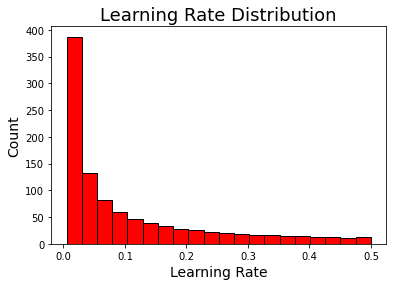

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

# Learning rate histogram
plt.hist(param_grid['learning_rate'], bins = 20, color = 'r', edgecolor = 'k');
plt.xlabel('Learning Rate', size = 14); plt.ylabel('Count', size = 14); plt.title('Learning Rate Distribution', size = 18);

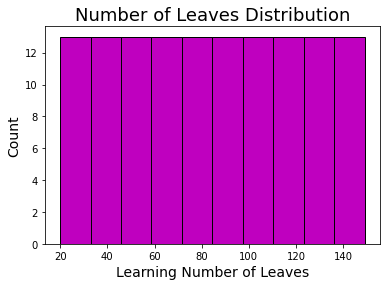

In [34]:
# number of leaves domain
plt.hist(param_grid['num_leaves'], color = 'm', edgecolor = 'k')
plt.xlabel('Learning Number of Leaves', size = 14); plt.ylabel('Count', size = 14); plt.title('Number of Leaves Distribution', size = 18);

In [35]:
random.seed(50)

# Randomly sample from dictionary
random_params = {k: random.sample(v, 1)[0] for k, v in param_grid.items()}
# Deal with subsample ratio
random_params['subsample'] = 1.0 if random_params['boosting_type'] == 'goss' else random_params['subsample']

random_params

{'boosting_type': 'goss',
 'num_leaves': 88,
 'learning_rate': 0.027778881111994384,
 'subsample_for_bin': 220000,
 'min_child_samples': 175,
 'reg_alpha': 0.8979591836734693,
 'reg_lambda': 0.6122448979591836,
 'colsample_bytree': 0.8222222222222222,
 'subsample': 1.0,
 'is_unbalance': False}

In [36]:
def random_search(param_grid, max_evals = MAX_EVALS):
    """Random search for hyperparameter optimization"""
    
    # Dataframe for results
    results = pd.DataFrame(columns = ['score', 'params', 'iteration'],
                                  index = list(range(MAX_EVALS)))
    
    # Keep searching until reach max evaluations
    for i in range(MAX_EVALS):
        
        # Choose random hyperparameters
        hyperparameters = {k: random.sample(v, 1)[0] for k, v in param_grid.items()}
        hyperparameters['subsample'] = 1.0 if hyperparameters['boosting_type'] == 'goss' else hyperparameters['subsample']

        # Evaluate randomly selected hyperparameters
        eval_results = objective(hyperparameters, i)
        
        results.loc[i, :] = eval_results
    
    # Sort with best score on top
    results.sort_values('score', ascending = False, inplace = True)
    results.reset_index(inplace = True)
    return results 

In [ ]:
random_results = random_search(param_grid)

print('The best validation score was {:.5f}'.format(random_results.loc[0, 'score']))
print('\nThe best hyperparameters were:')

import pprint
pprint.pprint(random_results.loc[0, 'params'])

/opt/conda/lib/python3.7/site-packages/lightgbm/callback.py:188: UserWarning: Early stopping is not available in dart mode
  warnings.warn('Early stopping is not available in dart mode')


In [ ]:
random_search_params = random_results.loc[0, 'params']

# Create, train, test model
model = lgb.LGBMClassifier(**random_search_params, random_state = 42)
model.fit(X_train, Y_train)

preds = model.predict_proba(x_test)[:, 1]

print('The best model from random search scores {:.5f} ROC AUC on the test set.'.format(roc_auc_score(y_test, preds)))

In [ ]:
random_results['params']